---
title: "DS202W - Group Project"
author: "Civic Tensor (Group 2)"
output: html
self-contained: true
jupyter: python3
engine: jupyter
editor:
  render-on-save: true
  preview: true
---

In [75]:
# libraries for dataframe and data manipulation
import pandas as pd
import numpy as np
import re
# libraries for plotting
from lets_plot import *
LetsPlot.setup_html()
from lets_plot.plot import gggrid
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
#libraries for table formatting
from pytablewriter import MarkdownTableWriter
# libraries for data exploration (e.g missing values)
import missingno as msno
import sweetviz as sv
#libraries for pre-processing the data 
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.preprocessing import LabelEncoder, StandardScaler, PolynomialFeatures, MinMaxScaler, PowerTransformer
#libraries for models
from xgboost import XGBClassifier, XGBRegressor
import lightgbm as lgb
from lightgbm import LGBMClassifier
from lightgbm.callback import early_stopping
from catboost import CatBoostClassifier
from sklearn.linear_model import LinearRegression, Lasso, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier, NearestNeighbors
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.svm import SVC
import miceforest as mf
#libraries for train/test split
from sklearn.model_selection import TimeSeriesSplit, train_test_split
#libraries for hyperparameter tuning
from sklearn.model_selection import GridSearchCV, cross_val_score
# libraries for metric definition (model evaluation)
from sklearn.metrics import mean_absolute_percentage_error, balanced_accuracy_score, confusion_matrix, roc_auc_score, f1_score, precision_score, recall_score, average_precision_score, make_scorer, classification_report, fbeta_score, precision_recall_curve
# libraries for dimensionality reduction
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import VarianceThreshold
# libraries for clustering
from kneed import KneeLocator
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from yellowbrick.cluster import KElbowVisualizer

import statsmodels.api as sm

In [118]:
# Open the data file
df = pd.read_csv('ds202w-group-projects-civil-war.csv')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7140 entries, 0 to 7139
Data columns (total 94 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  7140 non-null   int64  
 1   cowcode     7140 non-null   int64  
 2   year        7140 non-null   int64  
 3   warstds     7140 non-null   int64  
 4   ager        7140 non-null   float64
 5   agexp       7140 non-null   float64
 6   anoc        7140 non-null   int64  
 7   army85      7140 non-null   float64
 8   autch98     7140 non-null   int64  
 9   auto4       7140 non-null   float64
 10  autonomy    7140 non-null   float64
 11  avgnabo     7140 non-null   float64
 12  centpol3    7140 non-null   int64  
 13  coldwar     7140 non-null   int64  
 14  decade1     7140 non-null   int64  
 15  decade2     7140 non-null   int64  
 16  decade3     7140 non-null   int64  
 17  decade4     7140 non-null   int64  
 18  dem         7140 non-null   int64  
 19  dem4        7140 non-null  

In [6]:
df['warstds'].value_counts()

warstds
0    7024
1     116
Name: count, dtype: int64

data has already been imputed, no missing values

In [119]:
df = df.drop(columns=['Unnamed: 0'])

# use year to define the train/test split (80/20)
train_df = df[df['year'] < 1990]
test_df = df[df['year'] >= 1990]

# check class distribution in train and test sets
print(train_df['warstds'].value_counts(normalize=True))
print(test_df['warstds'].value_counts(normalize=True))   

warstds
0    0.983393
1    0.016607
Name: proportion, dtype: float64
warstds
0    0.984791
1    0.015209
Name: proportion, dtype: float64


In both the train and test sets, the distribution of the target variable is similar- highly imbalanced. Need to account for this when building the model and choosing evaluation metrics. Also consider threshold tuning - lowering the classification threshold (e.g. from 0.5 to 0.3) to catch more civil wars, even at the cost of more FPs.

In [120]:
# separate features and target
target_col = 'warstds'
feature_cols = [col for col in df.columns if col not in [target_col, 'year', 'cowcode']]

X_train, y_train = train_df[feature_cols], train_df[target_col]
X_test, y_test = test_df[feature_cols], test_df[target_col]

Dealing with class imbalance using the `scale_pos_weight` parameter in LightGBM

In [121]:
# calculate scale_pos_weight
neg, pos = y_train.value_counts()[0], y_train.value_counts()[1] 
scale_pos_weight = neg / pos

# instantiate LightGBM classifier
lgbm = LGBMClassifier(
    objective='binary',
    scale_pos_weight=scale_pos_weight,
    random_state=42,
    verbose=-1
)

lgbm.fit(X_train, y_train)

# predictions on train and test sets
y_train_pred = lgbm.predict(X_train)
y_train_pred_proba = lgbm.predict_proba(X_train)[:, 1]
y_test_pred = lgbm.predict(X_test)
y_test_pred_proba = lgbm.predict_proba(X_test)[:, 1]

# calculate metrics
print("TRAINING SET PERFORMANCE")
print("ROC-AUC:", roc_auc_score(y_train, y_train_pred_proba))
print("PR-AUC:", average_precision_score(y_train, y_train_pred_proba))
print("F2-score:", fbeta_score(y_train, y_train_pred, beta=2))
print(classification_report(y_train, y_train_pred, digits=3))

print("\nTEST SET PERFORMANCE")
print("ROC-AUC:", roc_auc_score(y_test, y_test_pred_proba))
print("PR-AUC:", average_precision_score(y_test, y_test_pred_proba))
print("F2-score:", fbeta_score(y_test, y_test_pred, beta=2))
print(classification_report(y_test, y_test_pred, digits=3))

TRAINING SET PERFORMANCE
ROC-AUC: 1.0
PR-AUC: 0.9999999999999999
F2-score: 1.0
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      5211
           1      1.000     1.000     1.000        88

    accuracy                          1.000      5299
   macro avg      1.000     1.000     1.000      5299
weighted avg      1.000     1.000     1.000      5299


TEST SET PERFORMANCE
ROC-AUC: 0.9157670790323852
PR-AUC: 0.3643438190385514
F2-score: 0.41044776119402987
              precision    recall  f1-score   support

           0      0.991     0.994     0.992      1813
           1      0.500     0.393     0.440        28

    accuracy                          0.985      1841
   macro avg      0.745     0.693     0.716      1841
weighted avg      0.983     0.985     0.984      1841



In [122]:
# feature importance
importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': lgbm.feature_importances_
}).sort_values(by='Importance', ascending=False)

ggplot(importance_df.head(20), aes(x='Feature', y='Importance')) + \
    geom_bar(stat='identity', fill='blue') + \
    coord_flip() + \
    labs(title='Top 20 Feature Importances', x='Feature', y='Importance') + \
    theme_minimal() 

Note:  
* False negative (FN): Model predicts *no civil war*, but a civil war occurs 
* False positive (FP): Model predicts *civil war*, but no civil war occurs
* True negative (TN): Model correctly predicts *no civil war*
* True positive (TP): Model correctly predicts *civil war*  

In this case, FN is more costly than FP. Civil wars involve loss of life, instability, and humanitarian crises, so failing to predict a civil war can have severe consequences. In contrast, falsely predicting a civil war may lead to unnecessary military interventions or resource allocation, but the costs are generally lower than the consequences of missing a civil war.  

We want to minimize FN, so we want to maximize recall (TP/(TP+FN)).  
F2-score is a variant of F1 that weights recall more than precision

Dealing with class imbalance by downsampling

In [11]:
def plot_confusion_matrix(y_true, y_pred, title="Confusion Matrix"):
    """
    Generates and plots a confusion matrix using Lets-Plot.

    Parameters:
    - y_true: Actual labels
    - y_pred: Predicted labels
    - title: Title for the plot
    """
    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_true, y_pred)
    
    # Extract TP, FP, FN, TN
    TN, FP, FN, TP = conf_matrix.ravel()

    # Convert confusion matrix to a DataFrame
    conf_matrix_df = pd.DataFrame(conf_matrix, 
                                  columns=["Predicted 0", "Predicted 1"], 
                                  index=["Actual 0", "Actual 1"])

    # Melt the confusion matrix DataFrame to long format
    conf_matrix_long = conf_matrix_df.reset_index().melt(id_vars="index", value_vars=["Predicted 0", "Predicted 1"])
    conf_matrix_long.columns = ["Actual", "Predicted", "Count"]

    # Define mapping for labels
    label_map = {
        ("Actual 0", "Predicted 0"): "TN",
        ("Actual 0", "Predicted 1"): "FP",
        ("Actual 1", "Predicted 0"): "FN",
        ("Actual 1", "Predicted 1"): "TP",
    }

    # Add annotations for TP, FP, FN, TN
    conf_matrix_long['Annotation'] = conf_matrix_long.apply(
        lambda row: f"{label_map[(row['Actual'], row['Predicted'])]}: {row['Count']}", axis=1
    )

    # Create confusion matrix plot with Lets-Plot
    plot = ggplot(conf_matrix_long, aes(x='Predicted', y='Actual', fill='Count')) + \
        geom_tile() + \
        geom_text(aes(label='Annotation'), size=10, color='black', vjust=0.5, hjust=0.5) + \
        scale_fill_gradient(low='white', high='#FF7F50') + \
        ggtitle(title) + \
        xlab('Predicted') + \
        ylab('Actual') + \
        coord_fixed(ratio=1) + \
        theme_minimal() + \
        theme(legend_position='right')

    return plot


conf_matrix_plot_train = plot_confusion_matrix(y_train, y_train_pred, title="Confusion Matrix (Train)")
conf_matrix_plot_test = plot_confusion_matrix(y_test, y_test_pred, title="Confusion Matrix (Test)")

gggrid([conf_matrix_plot_train, conf_matrix_plot_test])

In [13]:
# Feature Importance
importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': lgbm.feature_importances_
}).sort_values(by='Importance', ascending=False)

ggplot(importance_df.head(20), aes(x='Feature', y='Importance')) + \
    geom_bar(stat='identity', fill='blue') + \
    coord_flip() + \
    labs(title='Top 20 Feature Importances', x='Feature', y='Importance') + \
    theme_minimal() 

In [21]:
importance_df.tail(20)

,Feature,Importance
46,major,0
35,geo69,0
36,geo8,0
11,decade2,0
38,incumb,0
31,geo1,0
40,inst,0
43,lmtnest,0
10,decade1,0
9,coldwar,0


In [15]:
country_years = df.groupby('cowcode')['year'].agg(['min', 'max', 'count'])

# Set display option to show all rows
pd.set_option('display.max_rows', None)

print(country_years.sort_values('min'))  # see which countries enter when



          min   max  count
cowcode                   
2        1945  2000     56
712      1945  2000     56
355      1945  2000     56
350      1945  2000     56
740      1945  2000     56
345      1945  1990     46
339      1945  2000     56
360      1945  2000     56
325      1945  2000     56
315      1945  1992     48
310      1945  2000     56
305      1945  2000     56
290      1945  2000     56
260      1945  1990     46
235      1945  2000     56
800      1945  2000     56
230      1945  2000     56
364      1945  1990     46
700      1945  2000     56
450      1945  2000     56
530      1945  1994     50
560      1945  2000     56
630      1945  2000     56
640      1945  2000     56
645      1945  2000     56
710      1945  2000     56
395      1945  2000     56
385      1945  2000     56
380      1945  2000     56
375      1945  2000     56
651      1945  2000     56
670      1945  2000     56
678      1945  1989     45
390      1945  2000     56
225      1945  2000     56
7

In [16]:
# Find countries in test set but not in train
test_countries = set(test_df['cowcode'])
train_countries = set(train_df['cowcode'])

new_countries_in_test = test_countries - train_countries
print(new_countries_in_test)

{529, 531, 679, 316, 317, 701, 702, 704, 705, 703, 343, 344, 346, 347, 349, 359, 365, 366, 367, 368, 369, 370, 371, 372, 373, 255}


In [19]:
# filter test_df for oinly these new countries
new_country_df = test_df[test_df['cowcode'].isin(new_countries_in_test)]

# check how many civil war cases in these countries
civil_wars_in_new = new_country_df[new_country_df['warstds'] == 1]

print(f"Number of civil war cases in new test countries: {len(civil_wars_in_new)}")
print("Countries with civil war in test set but not in training:")
print(civil_wars_in_new['cowcode'].unique())

Number of civil war cases in new test countries: 11
Countries with civil war in test set but not in training:
[373 346 344 372 359 702 365 679 347]


In [ ]:
pd.reset_option('display.max_rows')  # reset display option to default

In [24]:
param_grid = {
    'num_leaves': [15, 31, 63],
    'max_depth': [-1, 10, 20],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 300, 500],
    'scale_pos_weight': [neg / pos]
}

lgbm = LGBMClassifier(objective='binary', random_state=42)
tscv = TimeSeriesSplit(n_splits=5)

grid_search = GridSearchCV(
    estimator=lgbm,
    param_grid=param_grid,
    scoring='f1',
    cv=tscv,
    n_jobs=-1
)

grid_search.fit(X_train, y_train)
print("Best params:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)


[LightGBM] [Info] Number of positive: 12, number of negative: 872
[LightGBM] [Info] Number of positive: 24, number of negative: 1743
[LightGBM] [Info] Number of positive: 45, number of negative: 2605[LightGBM] [Info] Number of positive: 59, number of negative: 3474[LightGBM] [Info] Number of positive: 24, number of negative: 1743
[LightGBM] [Info] Number of positive: 45, number of negative: 2605

[LightGBM] [Info] Number of positive: 12, number of negative: 872[LightGBM] [Info] Number of positive: 74, number of negative: 4342


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006285 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7325
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005695 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `fo

In [26]:
# Lists to store the results
f1_scores = []
f2_scores = []
auc_prs = []
recalls = []
num_folds = tscv.get_n_splits()

best_params = grid_search.best_params_

# cross-validation loop with the best hyperparameters
for fold, (train_idx, val_idx) in enumerate(tscv.split(X_train), 1):
    print(f"Processing fold {fold}/{num_folds}...")

    # Split into training and validation sets
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]
    
    # initialise the LightGBM model with the best hyperparameters
    model = LGBMClassifier(objective='binary', random_state=42, **best_params)
    _ = model.fit(X_train_fold, y_train_fold)
    
    # predictions
    y_val_pred_fold = model.predict(X_val_fold)
    y_val_pred_fold_proba = model.predict_proba(X_val_fold)[:, 1]
    
    # calculate and store metrics
    f1_scores.append(fbeta_score(y_val_fold, y_val_pred_fold, beta=1))
    f2_scores.append(fbeta_score(y_val_fold, y_val_pred_fold, beta=2))
    auc_prs.append(average_precision_score(y_val_fold, y_val_pred_fold_proba))
    recalls.append(recall_score(y_val_fold, y_val_pred_fold))

    
# calculate the average metrics 
print(f"Average F1 Score: {np.mean(f1_scores):.4f} ± {np.std(f1_scores):.4f}")
print(f"Average F2 Score: {np.mean(f2_scores):.4f} ± {np.std(f2_scores):.4f}")
print(f"Average AUC-PR: {np.mean(auc_prs):.4f} ± {np.std(auc_prs):.4f}")
print(f"Average Recall: {np.mean(recalls):.4f} ± {np.std(recalls):.4f}")

Processing fold 1/5...
Processing fold 2/5...
Processing fold 3/5...
Processing fold 4/5...
Processing fold 5/5...
Average F1 Score: 0.3733 ± 0.1119
Average F2 Score: 0.3478 ± 0.1258
Average AUC-PR: 0.3873 ± 0.0800
Average Recall: 0.3471 ± 0.1593


In [27]:
# Retrain the model on the full training set with the best hyperparameters
final_model = LGBMClassifier(objective='binary', random_state=42, **best_params)
_ = final_model.fit(X_train, y_train)

# Make predictions on the test set
y_test_pred = final_model.predict(X_test)
y_test_pred_proba = final_model.predict_proba(X_test)[:, 1]

# Calculate performance metrics on the test set
f1_test = fbeta_score(y_test, y_test_pred, beta=1)
f2_test = fbeta_score(y_test, y_test_pred, beta=2)
auc_pr_test = average_precision_score(y_test, y_test_pred_proba)
recall_test = recall_score(y_test, y_test_pred)

# Print test set performance
print("\nTest Set Performance:")
print(f"F1 Score: {f1_test:.4f}")
print(f"F2 Score: {f2_test:.4f}")
print(f"AUC-PR: {auc_pr_test:.4f}")
print(f"Recall: {recall_test:.4f}")



Test Set Performance:
F1 Score: 0.3478
F2 Score: 0.3077
AUC-PR: 0.3082
Recall: 0.2857


In [29]:
# Feature Importance
importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': final_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

# Plotting feature importance with Lets-Plot
ggplot(importance_df.head(20), aes(x='Feature', y='Importance')) + \
    geom_bar(stat='identity', fill='blue') + \
    coord_flip() + \
    labs(title='Top 20 Feature Importances', x='Feature', y='Importance') + \
    theme_minimal()

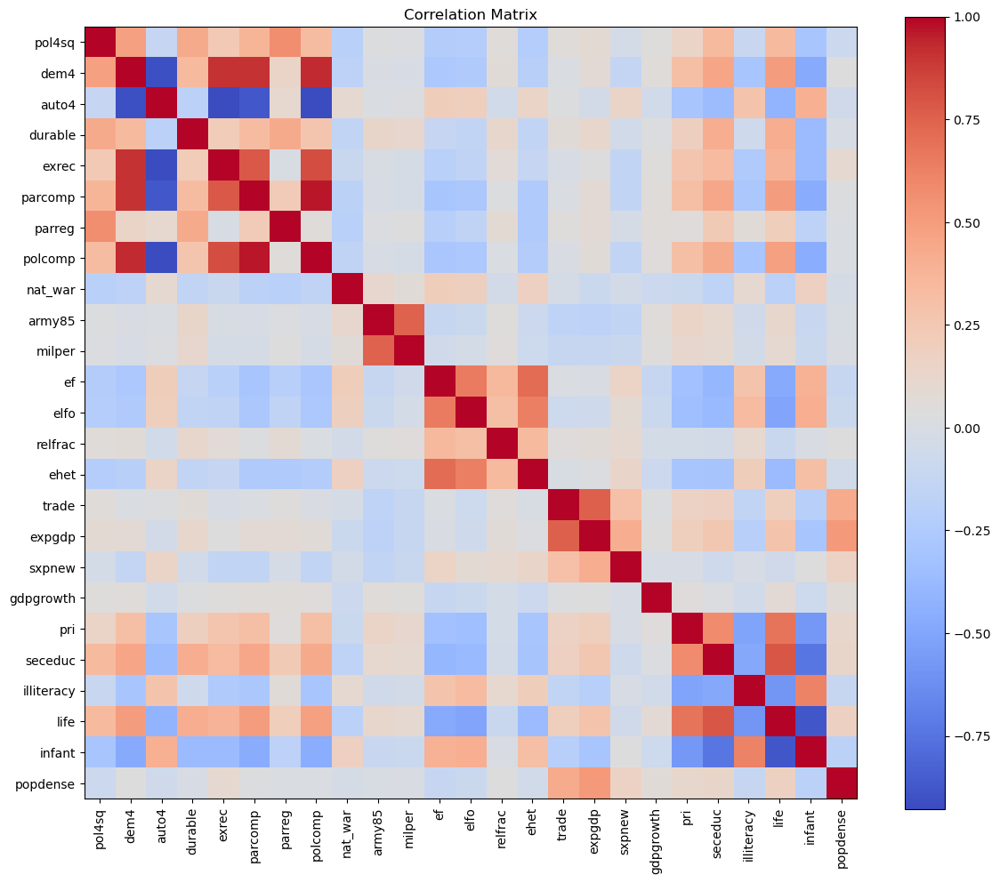

In [35]:
selected_features = [
    'pol4sq', 'dem4', 'auto4', 'durable', 'exrec', 'parcomp', 'parreg', 'polcomp',
    'nat_war', 'army85', 'milper',
    'ef', 'elfo', 'relfrac', 'ehet',
    'trade', 'expgdp', 'sxpnew', 'gdpgrowth',
    'pri', 'seceduc', 'illiteracy', 'life', 'infant', 'popdense'
]

# Create a new DataFrame with selected features
df_selected = df[selected_features] 

# check correlation matrix
correlation_matrix = df_selected.corr()
plt.figure(figsize=(12, 10))
plt.title('Correlation Matrix')
plt.imshow(correlation_matrix, cmap='coolwarm', interpolation='nearest')
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.tight_layout()
plt.show()

In [39]:
df_selected.describe()

,pol4sq,dem4,auto4,durable,exrec,parcomp,parreg,polcomp,nat_war,army85,...,trade,expgdp,sxpnew,gdpgrowth,pri,seceduc,illiteracy,life,infant,popdense
count,7140.000000,7140.000000,7140.000000,7140.000000,7140.000000,7140.000000,7140.000000,7140.000000,7140.000000,7.140000e+03,...,7140.000000,7140.000000,7140.000000,7140.000000,7140.000000,7140.000000,7140.000000,7140.000000,7140.000000,7140.000000
mean,58.990805,3.848800,3.945354,19.912116,5.292630,2.674515,3.754453,4.942726,0.371569,1.683894e+05,...,68.314705,31.289880,0.148731,0.019605,86.369254,41.782448,35.669466,60.219064,73.289612,116.521797
std,29.803687,4.018018,3.409524,22.357734,2.335922,1.512191,0.943991,3.570010,0.483258,3.998682e+05,...,42.616530,17.750063,0.101435,0.060403,24.025782,25.864927,18.072397,10.608636,45.032799,282.007185
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000e+00,...,0.000000,0.000000,0.002117,-0.520703,3.000000,1.000000,0.200000,31.219500,3.700000,0.628241
25%,47.191027,0.000000,0.000000,3.000000,3.000000,1.000000,3.000000,1.000000,0.000000,1.600000e+04,...,47.461852,20.981268,0.102436,0.000780,80.000000,22.000000,32.901872,52.340500,40.799999,23.173837
50%,61.202584,3.000000,3.934779,12.000000,5.283113,2.730307,4.000000,5.052078,0.000000,9.500000e+04,...,72.410634,33.355197,0.157830,0.022518,88.050484,43.735985,34.013934,61.371576,68.620892,101.885400
75%,81.000000,8.000000,7.000000,27.000000,8.000000,4.000000,4.000000,9.000000,1.000000,1.314761e+05,...,72.923785,33.630735,0.158552,0.040234,101.000000,49.125000,38.225000,69.034103,98.000000,119.211814
max,100.000000,10.000000,10.000000,99.000000,8.000000,5.000000,5.000000,10.000000,1.000000,4.100000e+06,...,965.700012,215.381805,2.139141,1.545591,174.000000,142.500000,94.300003,79.993401,215.000000,4990.655762


In [55]:
pipeline = Pipeline(steps=[
    ('variance', VarianceThreshold()),
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=5))
])

# fit the pipeline 
pipeline.fit(df_selected)

# transform the data using the fitted pipeline
pca_results = pipeline.transform(df_selected)

# create a DataFrame with the PCA results
# pca_df = pd.DataFrame(pca_results, columns=['PC1', 'PC2'])

print(f"Cumulative explained variance ratio: {pipeline.named_steps['pca'].explained_variance_ratio_.cumsum()}")

Cumulative explained variance ratio: [0.2868535  0.4015982  0.50272957 0.5784478  0.65183429]


In [56]:
min_samples = 10
nearest_neighbors = NearestNeighbors(n_neighbors=min_samples)
neighbors = nearest_neighbors.fit(pca_results)
distances, indices = neighbors.kneighbors(pca_results)
distances = np.sort(distances[:, min_samples - 1], axis=0)


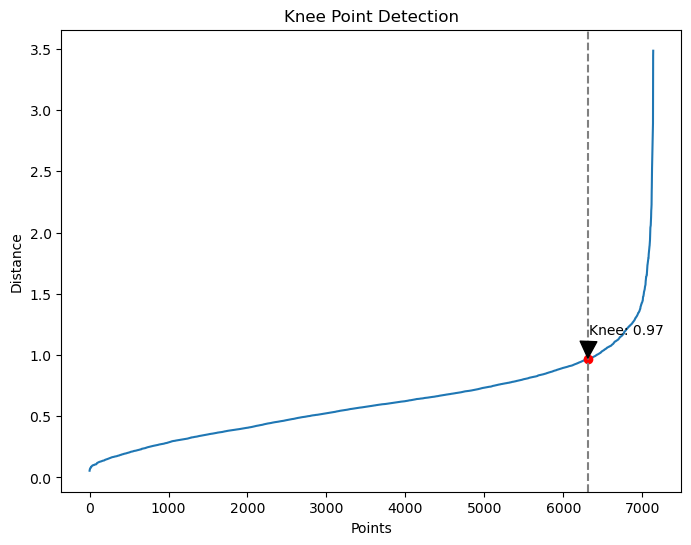

The value of the knee is: 0.9658992557890347


In [57]:
i = np.arange(len(distances))
knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='polynomial')

fig = plt.figure(figsize=(8, 6))
plt.plot(i, distances)
plt.xlabel("Points")
plt.ylabel("Distance")
plt.title("Knee Point Detection")

# Get knee coordinates
knee_index = knee.knee
knee_value = distances[knee_index]

plt.plot(knee_index, knee_value, 'ro')
plt.annotate(f"Knee: {knee_value:.2f}",
             xy=(knee_index, knee_value),
             xytext=(knee_index + 10, knee_value + 0.2),
             arrowprops=dict(facecolor='black', shrink=0.05))
plt.axvline(x=knee_index, color='gray', linestyle='--')
plt.show()

print(f"The value of the knee is: {knee_value}")

In [58]:
dbscan = DBSCAN(eps=knee_value, min_samples=min_samples)
labels = dbscan.fit_predict(pca_results)

In [59]:
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = list(labels).count(-1)

print(f'Estimated number of clusters: {n_clusters}')
print(f'Estimated number of noise points: {n_noise}')

Estimated number of clusters: 23
Estimated number of noise points: 356


In [60]:
from collections import Counter
cluster_labels = dbscan.labels_
print(Counter(cluster_labels))

Counter({0: 6378, -1: 356, 4: 67, 6: 40, 14: 36, 19: 23, 7: 21, 21: 20, 1: 19, 5: 16, 15: 16, 16: 16, 13: 15, 3: 13, 8: 13, 2: 12, 9: 12, 11: 12, 20: 11, 22: 10, 10: 10, 12: 10, 18: 10, 17: 4})


In [61]:
df_selected['Cluster'] = cluster_labels
cluster_profiles = df_selected.groupby('Cluster').mean()
print(cluster_profiles)

             pol4sq       dem4     auto4    durable     exrec   parcomp  \
Cluster                                                                   
-1        42.572196   3.159167  3.780314  13.627611  5.295930  2.407215   
 0        59.177498   3.733117  4.060719  19.661661  5.217648  2.641560   
 1        90.000000   0.000000  9.473684  16.736842  2.368421  1.000000   
 2        51.500000   0.000000  7.166667  30.083333  3.000000  1.000000   
 3        49.000000   0.000000  7.000000  43.000000  3.000000  1.000000   
 4        76.179104   8.716418  0.000000  13.119403  8.000000  3.716418   
 5        64.000000   8.000000  0.000000   7.500000  8.000000  5.000000   
 6        96.400000   9.800000  0.000000  11.200000  8.000000  5.000000   
 7        70.666667   8.380952  0.000000  25.000000  8.000000  3.476190   
 8        69.230769   8.307692  0.000000  39.384615  8.000000  3.307692   
 9         2.750000   2.000000  3.583333   4.333333  2.416667  4.000000   
 10       59.700000   0.0

/var/folders/m1/v5zskq_n3473s_qmdwjwwd7w0000gn/T/ipykernel_9507/1370158129.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected['Cluster'] = cluster_labels


In [66]:
# Assuming 'pca_results' and 'df_selected' are your existing PCA results and dataframe
df_plot = pd.DataFrame({
    'PC1': pca_results[:, 0],
    'PC2': pca_results[:, 1],
    'Cluster': cluster_labels.astype(str),  # Convert cluster labels to string (categorical)
    'cowcode': df['cowcode'],  # Country code
    'year': df['year'],
    'warstds': df['warstds']
})

# Create Plotly scatter plot with categorical coloring
fig = px.scatter(df_plot, x='PC1', y='PC2', color='Cluster', 
                 hover_data=['cowcode', 'year', 'warstds'],
                 title="DBSCAN Clustering on PCA Components",
                 color_discrete_sequence=px.colors.qualitative.Set1)  # Set discrete color scale

# Customize layout for better presentation
fig.update_layout(
    xaxis_title="Principal Component 1",
    yaxis_title="Principal Component 2",
    showlegend=True
)

# Show the plot with interactivity
fig.show()


In [67]:
# Assuming you have PCA results with 3 components
df_plot_3d = pd.DataFrame({
    'PC1': pca_results[:, 0],  # First principal component
    'PC2': pca_results[:, 1],  # Second principal component
    'PC3': pca_results[:, 2],  # Third principal component
    'Cluster': cluster_labels.astype(str),  # Convert cluster labels to string (categorical)
    'cowcode': df['cowcode'],  # Country code
    'year': df['year'],
    'warstds': df['warstds']
})

# Create Plotly 3D scatter plot with categorical coloring
fig = px.scatter_3d(df_plot_3d, x='PC1', y='PC2', z='PC3', color='Cluster', 
                    hover_data=['cowcode', 'year', 'warstds'],
                    title="DBSCAN 3D Clustering on PCA Components",
                    color_discrete_sequence=px.colors.qualitative.Set1)  # Set discrete color scale

# Customize layout for better presentation
fig.update_layout(
    scene=dict(
        xaxis_title="Principal Component 1",
        yaxis_title="Principal Component 2",
        zaxis_title="Principal Component 3"
    ),
    showlegend=True
)

# Show the plot with interactivity
fig.show()


In [68]:
# Assuming you have the 'Cluster' column with DBSCAN results (and 'warstds' as the binary outcome)
df_plot['Cluster'] = cluster_labels.astype(str)  # Ensure 'Cluster' is categorical

# Group by cluster and calculate the number of civil wars (warstds == 1) per cluster
civil_war_counts = df_plot.groupby('Cluster')['warstds'].sum()

# Display the results
print(civil_war_counts)


Cluster
-1     11
0     102
1       0
10      0
11      0
12      0
13      0
14      0
15      0
16      0
17      0
18      0
19      0
2       0
20      0
21      0
22      0
3       0
4       0
5       0
6       1
7       1
8       1
9       0
Name: warstds, dtype: int64


In [69]:
# Total country-years per cluster
total_counts = df_plot.groupby('Cluster').size()

# Civil war occurrences
civil_war_counts = df_plot.groupby('Cluster')['warstds'].sum()

# Civil war rate per cluster
civil_war_rate = (civil_war_counts / total_counts).fillna(0)

print(civil_war_rate)


Cluster
-1    0.030899
0     0.015992
1     0.000000
10    0.000000
11    0.000000
12    0.000000
13    0.000000
14    0.000000
15    0.000000
16    0.000000
17    0.000000
18    0.000000
19    0.000000
2     0.000000
20    0.000000
21    0.000000
22    0.000000
3     0.000000
4     0.000000
5     0.000000
6     0.025000
7     0.047619
8     0.076923
9     0.000000
dtype: float64


In [116]:
kmeans = KMeans(n_clusters=6, random_state=42)

kmeans.fit(pca_results)
kmeans_labels = [str(i) for i in kmeans.labels_]

df_plot_kmeans = pd.DataFrame({
    'PC1': pca_results[:, 0],
    'PC2': pca_results[:, 1],
    'Cluster': kmeans_labels,
    'cowcode': df['cowcode'], 
    'year': df['year'],
    'warstds': df['warstds']
})

# Create interactive KMeans plot
kmeans_plot = (
    ggplot(df_plot_kmeans, aes(x="PC1", y="PC2", color=as_discrete("Cluster")))
    + geom_point(size=4, alpha=0.7,
                 tooltips=layer_tooltips()
                     .line("Country code: @cowcode")
                     .line("Year: @year")
                     .line("War stds: @warstds")
                     .line("Cluster: @Cluster"))
    + scale_color_discrete()
    + ggtitle("KMeans Clustering on PCA Components")
    + xlab("Principal Component 1")
    + ylab("Principal Component 2")
    + theme_minimal()
    + ggsize(900, 600)
)

kmeans_plot.show()

In [72]:
kmeans_summary = (
    df_plot_kmeans.groupby('Cluster')
    .agg(
        num_points=('Cluster', 'size'),
        num_civil_wars=('warstds', 'sum'),
        civil_war_rate=('warstds', lambda x: x.sum() / len(x))
    )
    .reset_index()
)

print(kmeans_summary)

  Cluster  num_points  num_civil_wars  civil_war_rate
0       0        2184              39        0.017857
1       1        1430               2        0.001399
2       2        1677              55        0.032797
3       3          65               0        0.000000
4       4        1784              20        0.011211


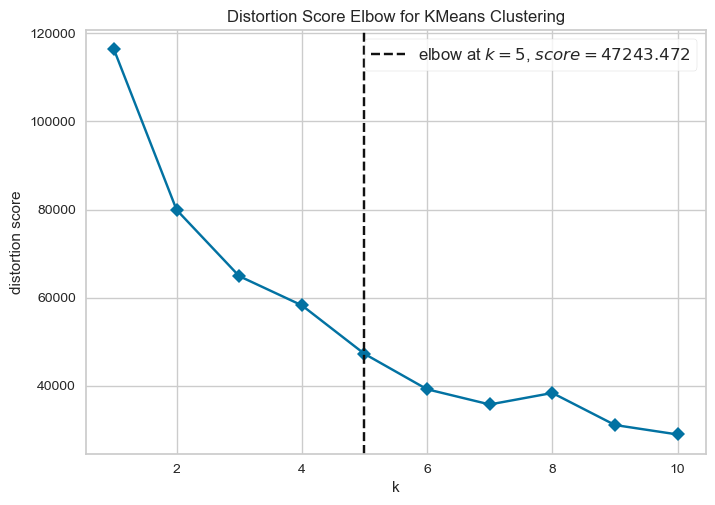

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [76]:
model = KMeans(random_state=42)
visualizer = KElbowVisualizer(model, k=(1, 11), metric="distortion",timings=False)  # Distortion metric for Elbow
visualizer.fit(pca_results)
visualizer.show()

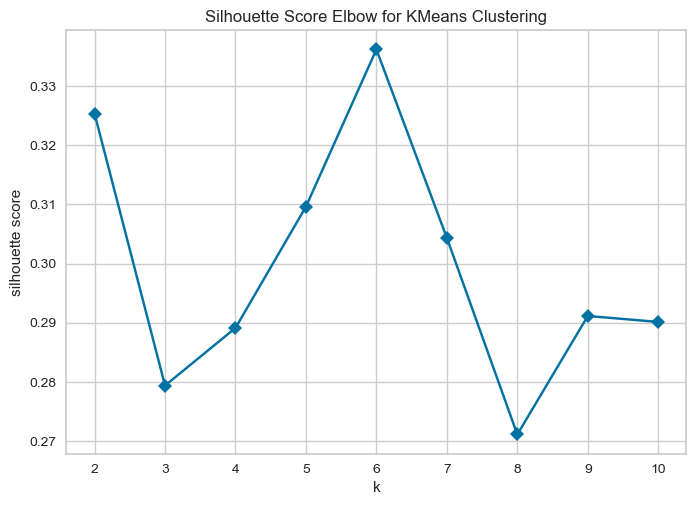

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [101]:
visualizer = KElbowVisualizer(model, k=(2, 11), metric="silhouette",timings=False, locate_elbow=False)  
visualizer.fit(pca_results)
visualizer.show()

silhouette: peak at k=6

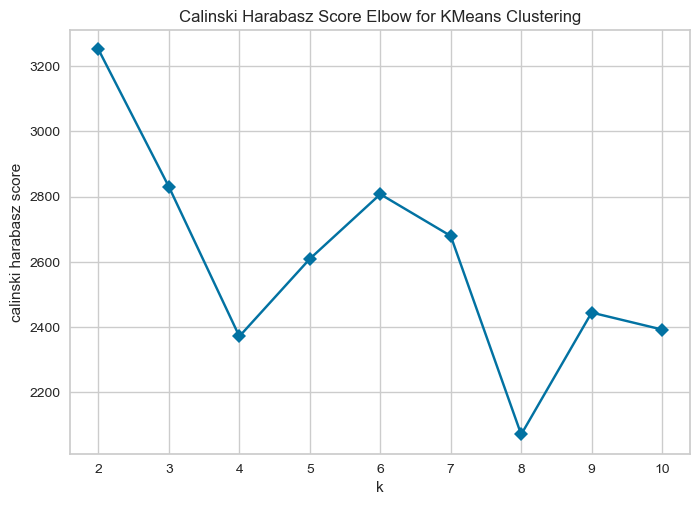

<Axes: title={'center': 'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [100]:
visualizer = KElbowVisualizer(model, k=(2, 11), metric="calinski_harabasz",timings=False, locate_elbow=False)  
visualizer.fit(pca_results)
visualizer.show()

CH score: peak at k=2

In [81]:
# Calculate Davies-Bouldin score for different k values
db_scores = []
k_values = list(range(2, 11))

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(pca_results)
    db_scores.append(davies_bouldin_score(pca_results, kmeans.labels_))

# Create a dataframe for plotting
db_data = pd.DataFrame({
    'K': k_values,
    'Davies-Bouldin score': db_scores
})

elbow = KneeLocator(range(2, 11), db_scores, curve="convex", direction="decreasing").elbow
print(f"Optimal K from Davies-Bouldin Method: {elbow}")

# Create the Davies-Bouldin plot with lets_plot
db_plot = (
    ggplot(db_data, aes(x='K', y='Davies-Bouldin score')) +
    geom_line(color='blue', size=1) +
    geom_point(color='red', size=3) +
    geom_vline(xintercept=elbow, linetype='dashed', color='green', size=1) +
    ggtitle('Davies-Bouldin Method for Optimal K') +
    xlab('Number of Clusters (K)') +
    ylab('Davies-Bouldin score') +
    theme_minimal()
)

# Display the plot
db_plot.show()

Optimal K from Davies-Bouldin Method: 2


DB score: min at k=6

|Method|Optimal k|
|---|---|
|Elbow method| 5|
|Silhouette method| 6|
|Calinski Harabasz score| 2|
|Davies-Bouldin method| 6|

Based on the 4 methods, k=6 is the most consistent choice, so we will use k=6 for k-means clustering.

In [83]:
# use optimal k=6
kmeans = KMeans(n_clusters=6, random_state=42)
kmeans.fit(pca_results)
kmeans_labels = [str(i) for i in kmeans.labels_]

df_plot_kmeans = pd.DataFrame({
    'PC1': pca_results[:, 0],
    'PC2': pca_results[:, 1],
    'Cluster': kmeans_labels,
    'cowcode': df['cowcode'], 
    'year': df['year'],
    'warstds': df['warstds']
})

# summarize the clusters
kmeans_summary = (
    df_plot_kmeans.groupby('Cluster')
    .agg(
        num_points=('Cluster', 'size'),
        num_civil_wars=('warstds', 'sum'),
        civil_war_rate=('warstds', lambda x: x.sum() / len(x))
    )
    .reset_index()
)

print(kmeans_summary)

  Cluster  num_points  num_civil_wars  civil_war_rate
0       0        1615              36        0.022291
1       1        1410               2        0.001418
2       2        1621              51        0.031462
3       3          64               0        0.000000
4       4        2338              26        0.011121
5       5          92               1        0.010870


selected_features = [
    'pol4sq', 'dem4', 'auto4', 'durable', 'exrec', 'parcomp', 'parreg', 'polcomp',
    'nat_war', 'army85', 'milper',
    'ef', 'elfo', 'relfrac', 'ehet',
    'trade', 'expgdp', 'sxpnew', 'gdpgrowth',
    'pri', 'seceduc', 'illiteracy', 'life', 'infant', 'popdense'
]

In [117]:
df_selected['Cluster'] = kmeans.labels_

ggplot(df_selected, aes(x='Cluster', y='infant')) + \
    geom_boxplot() + \
    labs(title='Infant mortality rate by Cluster', x='Cluster', y='Infant') + \
    theme_minimal()

/var/folders/m1/v5zskq_n3473s_qmdwjwwd7w0000gn/T/ipykernel_9507/3980457065.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [91]:
df['Cluster'] = kmeans.labels_
pd.crosstab(df['Cluster'], df['warstds'])

warstds,0,1
Cluster,,
0,1579,36
1,1408,2
2,1570,51
3,64,0
4,2312,26
5,91,1


In [99]:
pd.crosstab(df['Cluster'], df['nat_war'])

nat_war,0,1
Cluster,,
0,793,822
1,1210,200
2,760,861
3,34,30
4,1648,690
5,42,50


In [103]:
# Create a list of data frames for each loading
list_dfs = [pd.DataFrame({"features":selected_features,"loadings":comp}) for comp in pipeline.named_steps["pca"].components_]

# Concatenate the list of data frames to create a singular data frame
loadings_df = pd.concat(list_dfs, keys = [i + 1 for i in range(5)], names = ["component","row"]).\
    reset_index().\
        drop(columns=["row"],index=1)

# Create a new column showing the absolute value of the loading
loadings_df["abs_loadings"] = np.abs(loadings_df["loadings"])

(
    ggplot(loadings_df.query("component <= 5"), aes("loadings", "features", fill="abs_loadings")) +
    geom_bar(stat="identity") +
    facet_wrap(facets="component") +
    scale_fill_viridis() +
    theme(legend_position="none")
)

In [104]:
# Add ranking within each component based on absolute loading size
loadings_df["rank"] = loadings_df.groupby("component")["abs_loadings"].rank(ascending=False, method="first")

top_loadings_df = loadings_df[loadings_df["rank"] <= 8]

(
    ggplot(top_loadings_df, aes("loadings", "features", fill="abs_loadings")) +
    geom_bar(stat="identity") +
    facet_wrap(facets="component", scales="free_y") +
    scale_fill_viridis() +
    theme(legend_position="none")
)


In [106]:
df_selected.columns

Index(['pol4sq', 'dem4', 'auto4', 'durable', 'exrec', 'parcomp', 'parreg',
       'polcomp', 'nat_war', 'army85', 'milper', 'ef', 'elfo', 'relfrac',
       'ehet', 'trade', 'expgdp', 'sxpnew', 'gdpgrowth', 'pri', 'seceduc',
       'illiteracy', 'life', 'infant', 'popdense', 'Cluster'],
      dtype='object')

In [107]:
vars_to_profile = ['pol4sq','dem4','auto4','durable','ef','trade','gdpgrowth','life']
profile = df_selected.groupby('Cluster')[vars_to_profile] \
            .agg(['median', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]) \
            .rename(columns={'<lambda_0>':'Q1','<lambda_1>':'Q3'})
print(profile)

             pol4sq                   dem4              auto4                 \
             median     Q1       Q3 median    Q1    Q3 median        Q1   Q3   
Cluster                                                                        
0         47.250824   16.0   64.000    6.0   4.0   8.0    0.0  0.000000  2.0   
1        100.000000  100.0  100.000   10.0  10.0  10.0    0.0  0.000000  0.0   
2         49.000000   36.0   60.653    0.0   0.0   0.0    7.0  4.132683  7.0   
3         61.485155    4.0   81.000    2.0   0.0   2.0    4.0  4.000000  9.0   
4         61.008116   49.0   64.000    0.0   0.0   1.0    7.0  4.000000  8.0   
5         49.000000   49.0  100.000    0.0   0.0  10.0    7.0  0.000000  7.0   

        durable  ...        ef       trade                         gdpgrowth  \
         median  ...        Q3      median          Q1          Q3    median   
Cluster          ...                                                           
0           5.0  ...  0.656000   72.688

In [108]:
df_filtered = df_selected.copy()
df_filtered['year'] = df['year']
df_filtered['warstds'] = df['warstds']
df_filtered['cowcode'] = df['cowcode']  

train_df = df_filtered[df_filtered['year'] < 1990]
test_df = df_filtered[df_filtered['year'] >= 1990]

# Separate features and target
target_col = 'warstds'
feature_cols = [col for col in df_filtered.columns if col not in [target_col, 'year', 'cowcode']]

X_train, y_train = train_df[feature_cols], train_df[target_col]
X_test, y_test = test_df[feature_cols], test_df[target_col]

In [113]:
tscv = TimeSeriesSplit(n_splits=5)

# Set up pipeline
pipeline = Pipeline([
    ('model', LGBMClassifier(objective='binary', random_state=42))
])

# Grid search over 'model__param' style names
grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid={
        'model__num_leaves': [15, 31, 63],
        'model__max_depth': [-1, 10, 20],
        'model__learning_rate': [0.01, 0.05, 0.1],
        'model__n_estimators': [100, 300, 500],
        'model__scale_pos_weight': [neg / pos]
    },
    scoring='f1',
    cv=tscv,
    n_jobs=-1,
    verbose=1
)

grid_search.fit(
    X_train, y_train,
    model__categorical_feature=['Cluster']
)

print("Best params:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)


Fitting 5 folds for each of 81 candidates, totalling 405 fits
[LightGBM] [Info] Number of positive: 12, number of negative: 872
[LightGBM] [Info] Number of positive: 12, number of negative: 872
[LightGBM] [Info] Number of positive: 74, number of negative: 4342
[LightGBM] [Info] Number of positive: 59, number of negative: 3474
[LightGBM] [Info] Number of positive: 45, number of negative: 2605
[LightGBM] [Info] Number of positive: 24, number of negative: 1743
[LightGBM] [Info] Number of positive: 24, number of negative: 1743
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3736
[LightGBM] [Info] Total Bins 3736
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testi

In [114]:
# Lists to store the results
f1_scores = []
f2_scores = []
auc_prs = []
recalls = []
num_folds = tscv.get_n_splits()

best_params = grid_search.best_params_

# cross-validation loop with the best hyperparameters
for fold, (train_idx, val_idx) in enumerate(tscv.split(X_train), 1):
    print(f"Processing fold {fold}/{num_folds}...")

    # Split into training and validation sets
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]
    
    # initialise the LightGBM model with the best hyperparameters
    model = LGBMClassifier(objective='binary', random_state=42, **best_params)
    _ = model.fit(X_train_fold, y_train_fold)
    
    # predictions
    y_val_pred_fold = model.predict(X_val_fold)
    y_val_pred_fold_proba = model.predict_proba(X_val_fold)[:, 1]
    
    # calculate and store metrics
    f1_scores.append(fbeta_score(y_val_fold, y_val_pred_fold, beta=1))
    f2_scores.append(fbeta_score(y_val_fold, y_val_pred_fold, beta=2))
    auc_prs.append(average_precision_score(y_val_fold, y_val_pred_fold_proba))
    recalls.append(recall_score(y_val_fold, y_val_pred_fold))

    
# calculate the average metrics 
print(f"Average F1 Score: {np.mean(f1_scores):.4f} ± {np.std(f1_scores):.4f}")
print(f"Average F2 Score: {np.mean(f2_scores):.4f} ± {np.std(f2_scores):.4f}")
print(f"Average AUC-PR: {np.mean(auc_prs):.4f} ± {np.std(auc_prs):.4f}")
print(f"Average Recall: {np.mean(recalls):.4f} ± {np.std(recalls):.4f}")

Processing fold 1/5...
Processing fold 2/5...
Processing fold 3/5...
Processing fold 4/5...
Processing fold 5/5...
Average F1 Score: 0.2528 ± 0.0885
Average F2 Score: 0.2086 ± 0.0902
Average AUC-PR: 0.3375 ± 0.0662
Average Recall: 0.1933 ± 0.0991


In [115]:
# Retrain the model on the full training set with the best hyperparameters
final_model = LGBMClassifier(objective='binary', random_state=42, **best_params)
_ = final_model.fit(X_train, y_train)

# Make predictions on the test set
y_test_pred = final_model.predict(X_test)
y_test_pred_proba = final_model.predict_proba(X_test)[:, 1]

# Calculate performance metrics on the test set
f1_test = fbeta_score(y_test, y_test_pred, beta=1)
f2_test = fbeta_score(y_test, y_test_pred, beta=2)
auc_pr_test = average_precision_score(y_test, y_test_pred_proba)
recall_test = recall_score(y_test, y_test_pred)

# Print test set performance
print("\nTest Set Performance:")
print(f"F1 Score: {f1_test:.4f}")
print(f"F2 Score: {f2_test:.4f}")
print(f"AUC-PR: {auc_pr_test:.4f}")
print(f"Recall: {recall_test:.4f}")



Test Set Performance:
F1 Score: 0.2564
F2 Score: 0.2033
AUC-PR: 0.2466
Recall: 0.1786
